In [98]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.io as pio
import trimesh
import nibabel as nib
from scipy.spatial import cKDTree
from skimage import measure

def show_mask_mesh_registration(
    idx,
    health_status,
    show=True,
    Visualize=True,
    save_vertex_labels_txt=True
):
    """
    Shows a 3D Plotly visualization of mesh with transferred mask segment labels for a given subject (idx) and health status.
    Optionally saves the interactive visualization to a JSON file.
    Optionally saves a .txt file with closest label per mesh vertex.

    Args:
        idx (int): Subject identifier (e.g. 76)
        health_status (str): 'healthy', 'cirrhotic', etc.
        show (bool): If True, (legacy, for backward compatibility) will be used if Visualize is not specified.
        Visualize (bool): If True, display the interactive visualization in notebook. Default: True.
        save_vertex_labels_txt (bool): If True, save a .txt with per-vertex closest segment (default: True)

    Returns:
        plotly.graph_objects.Figure: The constructed figure (useful for saving or further manipulation)
    """
    try:
        # --- Filepaths: construct from idx and health_status ---
        mask_file = (
            f"/home/ralbe/pyhppc_project/cirr_segm_clean/"
            f"cirrhotic_liver_segmentation/cirr_mri_600/data/processed/"
            f"{health_status}/T1_images/segmentations_{idx}/liver_segments_merged.nii.gz"
        )
        import os

        mesh_file_train = f"/home/ralbe/DALS/mesh_autodecoder/data/train_meshes/{health_status}_{idx}_testing.obj"
        mesh_file_test = f"/home/ralbe/DALS/mesh_autodecoder/data/test_meshes/{health_status}_{idx}_testing.obj"

        if os.path.isfile(mesh_file_train):
            mesh_file = mesh_file_train
        elif os.path.isfile(mesh_file_test):
            mesh_file = mesh_file_test
        else:
            return

        mask_img = nib.load(mask_file)
        mask_data = mask_img.get_fdata()
        mesh = trimesh.load(mesh_file)

        # Rescale mesh to mean 0 and max radius 1
        verts = mesh.vertices
        verts_centered = verts - verts.mean(axis=0)
        max_radius = np.linalg.norm(verts_centered, axis=1).max()
        verts_normalized = verts_centered / max_radius
        mesh.vertices = verts_normalized

        # Marching cubes for surface
        verts_mc, faces_mc, normals_mc, values_mc = measure.marching_cubes(
            mask_data, level=0.5, step_size=3
        )

        # Per-vertex label on marching cubes
        voxel_coords = np.floor(verts_mc).astype(int)
        shape = mask_data.shape
        valid_mask = (
            (voxel_coords[:,0] >= 0) & (voxel_coords[:,0] < shape[0]) &
            (voxel_coords[:,1] >= 0) & (voxel_coords[:,1] < shape[1]) &
            (voxel_coords[:,2] >= 0) & (voxel_coords[:,2] < shape[2])
        )
        labels_mc = np.zeros(verts_mc.shape[0], dtype=np.uint8)
        labels_mc[valid_mask] = mask_data[
            voxel_coords[valid_mask, 0],
            voxel_coords[valid_mask, 1],
            voxel_coords[valid_mask, 2]
        ].astype(np.uint8)

        # Use only nonzero-labeled vertices for label transfer
        pos_points_mask = labels_mc > 0
        verts_mc_pos = verts_mc[pos_points_mask]
        labels_mc_pos = labels_mc[pos_points_mask]

        # Rescale positive-labeled marching cubes mesh vertices: center at mean=0, max radius=1 (using ALL verts_mc)
        verts_mc_mean = verts_mc.mean(axis=0)
        verts_mc_pos_centered = verts_mc_pos - verts_mc_mean
        mc_max_radius = np.linalg.norm((verts_mc - verts_mc_mean), axis=1).max()
        verts_mc_pos_normalized = verts_mc_pos_centered / mc_max_radius

        def center_mesh(verts):
            center = verts.mean(axis=0)
            return verts - center

        verts_obj_for_vis = center_mesh(mesh.vertices)
        verts_mc_for_vis = center_mesh((verts_mc - verts_mc_mean) / mc_max_radius)

        # Transfer labels to OBJ mesh vertices (skip label 0 entirely)
        tree = cKDTree(verts_mc_pos_normalized)
        dists, nearest_idx = tree.query(mesh.vertices)
        mesh_labels = labels_mc_pos[nearest_idx]

        # Save per-vertex label assignments as .txt (one label [int] per line, length=N_vertices)
        if save_vertex_labels_txt:
            export_dir = '/home/ralbe/DALS/mesh_autodecoder/interactive_figures'
            if not os.path.exists(export_dir):
                os.makedirs(export_dir, exist_ok=True)
            txt_save_path = os.path.join(export_dir, f"meshreg_{health_status}_{idx}_vertexlabel.txt")
            np.savetxt(txt_save_path, mesh_labels.astype(np.uint8), fmt="%d")

        # Color mapping
        label_values = np.arange(1, 9)
        label_colors_hex = [
            "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728",
            "#9467bd", "#8c564b", "#e377c2", "#7f7f7f"
        ]
        label_colors_rgb = np.array([tuple(int(h[i:i+2], 16) for i in (1, 3, 5)) for h in label_colors_hex])
        label_to_color = {val: color for val, color in zip(label_values, label_colors_rgb)}

        vertex_colors = np.array([label_to_color.get(int(l), (220,220,220)) for l in mesh_labels])

        faces_obj_for_vis = mesh.faces
        face_labels = mesh_labels[faces_obj_for_vis]
        face_mask = np.all(face_labels > 0, axis=1)
        faces_obj_for_vis_masked = faces_obj_for_vis[face_mask]

        face_labels_masked = face_labels[face_mask]
        all_face_labels = face_labels_masked.flatten()

        # --- Segment control logic ---
        segment_traces = []
        traces_label_names = []
        for label_idx, label_val in enumerate(label_values):
            # Faces where all vertices have this label
            face_mask_label = np.all(face_labels == label_val, axis=1)
            faces_label = faces_obj_for_vis[face_mask_label]
            if faces_label.shape[0] == 0:
                continue
            trace_name = f"Segment {label_val}"
            traces_label_names.append(trace_name)
            segment_traces.append(
                go.Mesh3d(
                    x=verts_obj_for_vis[:,0],
                    y=verts_obj_for_vis[:,1],
                    z=verts_obj_for_vis[:,2],
                    i=faces_label[:,0],
                    j=faces_label[:,1],
                    k=faces_label[:,2],
                    vertexcolor=(np.array([label_to_color[label_val]] * verts_obj_for_vis.shape[0]) / 255.0),
                    name=trace_name,
                    showscale=False,
                    opacity=1.0,
                    visible=True
                )
            )
        # Add marching cubes mesh as wireframe for context (in black)
        def mesh_wireframe_trace(vertices, faces, color, name):
            edges = set()
            for tri in faces:
                edges.update([
                    tuple(sorted((tri[0], tri[1]))),
                    tuple(sorted((tri[1], tri[2]))),
                    tuple(sorted((tri[2], tri[0]))),
                ])
            edges = np.array(list(edges))
            x_lines = []
            y_lines = []
            z_lines = []
            for i0, i1 in edges:
                x_lines += [vertices[i0, 0], vertices[i1, 0], None]
                y_lines += [vertices[i0, 1], vertices[i1, 1], None]
                z_lines += [vertices[i0, 2], vertices[i1, 2], None]
            return go.Scatter3d(
                x=x_lines, y=y_lines, z=z_lines,
                mode='lines', name=name, line=dict(color=color, width=2)
            )

        wireframe_trace = mesh_wireframe_trace(verts_mc_for_vis, faces_mc, color='black', name='Mask Mesh (marching cubes)')

        # All traces
        all_traces = segment_traces + [wireframe_trace]

        fig = go.Figure(data=all_traces)

        segment_buttons = []
        n_segments = len(segment_traces)
        for idx_btn, trace_name in enumerate(traces_label_names):
            visibility = [False] * (n_segments+1)
            visibility[idx_btn] = True
            button = dict(
                label=trace_name,
                method='update',
                args=[
                    {'visible': visibility},
                    {'title': f"Viewing: {trace_name} (click 'Show All' to show all segments)"}
                ]
            )
            segment_buttons.append(button)

        # All segments button
        visibility_all = [True] * (n_segments) + [True]
        segment_buttons.append(
            dict(
                label='Show All',
                method='update',
                args=[
                    {'visible': visibility_all},
                    {'title': (
                        f"OBJ Mesh colored by closest *nonzero* mask label (1-8); "
                        f"Mask Surface (wire) in black [ID={idx}, {health_status}]"
                    )}
                ]
            )
        )

        fig.update_layout(
            height=1200, width=1200,
            title=(
                "OBJ Mesh colored by closest *nonzero* mask label (1-8); Mask Surface (wire) in black"
                "<br><sup>Select segment label to show/hide via controls below</sup>"
            ),
            showlegend=True,
            updatemenus=[
                dict(
                    type='buttons',
                    showactive=True,
                    buttons=segment_buttons,
                    direction='down',
                    x=0.02,
                    y=1.04,
                    xanchor='left',
                    yanchor='top',
                ),
            ],
            margin=dict(l=10, r=10, t=65, b=10),
            scene=dict(
                xaxis=dict(visible=False),
                yaxis=dict(visible=False),
                zaxis=dict(visible=False),
                aspectmode="data"
            ),
        )
        # Pick which should control visualization: Visualize argument preferred, fallback to show for backward compatibility
        do_visualize = Visualize
        if do_visualize is None:
            do_visualize = show

        if do_visualize:
            fig.show()

        # Always use predetermined save path
        export_dir = '/home/ralbe/DALS/mesh_autodecoder/interactive_figures'
        if not os.path.exists(export_dir):
            os.makedirs(export_dir, exist_ok=True)
        save_json_path_auto = os.path.join(
            export_dir, f"meshreg_{health_status}_{idx}.json"
        )
        fig.write_json(save_json_path_auto)

        return fig

    except Exception as e:
        # Do not crash if anything fails
        # import traceback
        # print(f"Error in show_mask_mesh_registration for idx={idx}, health_status={health_status}: {e}")
        # traceback.print_exc()
        return None



In [99]:

# # Create and show visualization, and save it to an auto-named JSON file (.json and .txt files placed in the output folder)
# fig = show_mask_mesh_registration(
#     idx=92,
#     health_status="cirrhotic",
#     Visualize=True,                         # whether to display in notebook
#     # save_json_path="/some/custom/path.json" # optional (will otherwise use correct folder & naming convention)
# )

path = "/home/ralbe/DALS/mesh_autodecoder/interactive_figures/meshreg_cirrhotic_92.json"
fig_from_file = pio.read_json(path)
fig_from_file.show()


In [100]:
# Visualize the mesh with the labels at each given vertex (interactive with plotly, label-specific colors):
import trimesh
import numpy as np
import plotly.graph_objects as go
import matplotlib.pyplot as plt

vertex_label_path = "/home/ralbe/DALS/mesh_autodecoder/interactive_figures/meshreg_cirrhotic_92_vertexlabel.txt"
mesh_path = '/home/ralbe/DALS/mesh_autodecoder/data/train_meshes/cirrhotic_92_testing.obj'
mesh = trimesh.load(mesh_path)

# The .txt is one label per line, as many lines as vertices.
with open(vertex_label_path, "r") as f:
    vertex_labels = np.array([int(line.strip()) for line in f], dtype=int)

# Get a color for each unique label using matplotlib colormaps
unique_labels = np.unique(vertex_labels)
cmap = plt.get_cmap('tab10' if len(unique_labels) <= 10 else 'tab20')
label_to_color = {label: "rgb{}".format(tuple((np.array(cmap(i % cmap.N)[:3]) * 255).astype(int))) for i, label in enumerate(unique_labels)}
vertex_colors = np.array([label_to_color[label] for label in vertex_labels])

# Triangles for plotly: unpack faces into i, j, k arrays
i, j, k = mesh.faces[:, 0], mesh.faces[:, 1], mesh.faces[:, 2]

# Mesh surface trace for context
mesh_trace = go.Mesh3d(
    x=mesh.vertices[:, 0],
    y=mesh.vertices[:, 1],
    z=mesh.vertices[:, 2],
    i=i,
    j=j,
    k=k,
    color='lightgrey',
    opacity=0.5,
    name="Mesh",
    flatshading=True,
    showscale=False
)

# Annotate each vertex with its label, with marker colored by label
vertex_trace = go.Scatter3d(
    x=mesh.vertices[:, 0],
    y=mesh.vertices[:, 1],
    z=mesh.vertices[:, 2],
    mode='text+markers',
    text=[str(l) for l in vertex_labels],
    textposition="top center",
    marker=dict(
        size=5,
        color=[label_to_color[l] for l in vertex_labels],
        opacity=0.9,
        line=dict(width=0),
    ),
    textfont=dict(size=10, color=[label_to_color[l] for l in vertex_labels]),
    name="Labels"
)

layout = go.Layout(
    scene=dict(
        xaxis_title="X",
        yaxis_title="Y",
        zaxis_title="Z"
    ),
    title="Mesh with Vertex Labels (Label Colored)",
    showlegend=False,
    width=1000,
    height=800
)

fig = go.Figure(data=[mesh_trace, vertex_trace], layout=layout)
fig.show()


In [2]:
import pandas as pd
import os

# Paths to CSV files
cirrhotic_csv_path = "/home/ralbe/pyhppc_project/cirr_segm_clean/cirrhotic_liver_segmentation/cirr_mri_600/data/cirrhotic_dataset.csv"
healthy_csv_path = "/home/ralbe/pyhppc_project/cirr_segm_clean/cirrhotic_liver_segmentation/cirr_mri_600/data/healthy_dataset.csv"

# Load datasets
cirrhotic_df = pd.read_csv(cirrhotic_csv_path)
healthy_df = pd.read_csv(healthy_csv_path)

# Filter entries where 'raw_T1_img' column exists and is not null/empty
if 'raw_T1_img' in cirrhotic_df.columns:
    cirrhotic_valid = cirrhotic_df[~cirrhotic_df['raw_T1_img'].isnull() & (cirrhotic_df['raw_T1_img'] != '')]
else:
    cirrhotic_valid = pd.DataFrame(columns=cirrhotic_df.columns)  # empty dataframe

if 'raw_T1_img' in healthy_df.columns:
    healthy_valid = healthy_df[~healthy_df['raw_T1_img'].isnull() & (healthy_df['raw_T1_img'] != '')]
else:
    healthy_valid = pd.DataFrame(columns=healthy_df.columns)  # empty dataframe

# Get all indexes for cirrhotic and healthy samples
cirrhotic_indexes = cirrhotic_valid.index.tolist()
healthy_indexes = healthy_valid.index.tolist()

# Get all Patient IDs for cirrhotic and healthy samples
cirrhotic_patient_ids = cirrhotic_valid['Patient ID'].tolist() if 'Patient ID' in cirrhotic_valid.columns else []
healthy_patient_ids = healthy_valid['Patient ID'].tolist() if 'Patient ID' in healthy_valid.columns else []


# print(cirrhotic_patient_ids)
# print(healthy_patient_ids)
from tqdm import tqdm


problematic_cirrhotic_ids = []
for idx in tqdm(cirrhotic_patient_ids):
    output_txt = f'/home/ralbe/DALS/mesh_autodecoder/interactive_figures/meshreg_cirrhotic_{idx}_vertexlabel.txt'
    output_json = f'/home/ralbe/DALS/mesh_autodecoder/interactive_figures/meshreg_cirrhotic_{idx}.json'
    if os.path.exists(output_txt) or os.path.exists(output_json):
        # print(f'Skipping {idx} because it already exists')
        continue
    try:
        show_mask_mesh_registration(
            idx,
            health_status="cirrhotic",
            show=False,
            Visualize=False,
            save_vertex_labels_txt=True,
            # save_json_path=output_json
        )
    except Exception as e:
        print(f'Error with {idx}')
        problematic_cirrhotic_ids.append(idx)

print('Problematic cirrhotic ids:', problematic_cirrhotic_ids)

problematic_healthy_ids = []
for idx in tqdm(healthy_patient_ids):
    output_txt = f'/home/ralbe/DALS/mesh_autodecoder/interactive_figures/meshreg_healthy_{idx}_vertexlabel.txt'
    output_json = f'/home/ralbe/DALS/mesh_autodecoder/interactive_figures/meshreg_healthy_{idx}.json'
    if os.path.exists(output_txt) or os.path.exists(output_json):
        # print(f'Skipping {idx} because it already exists')
        continue
    try:
        show_mask_mesh_registration(
            idx,
            health_status="healthy",
            show=False,
            Visualize=False,
            save_vertex_labels_txt=True,
            # save_json_path=output_path
        )
    except Exception as e:
        print(f'Error with {idx}')
        problematic_healthy_ids.append(idx)

print('Problematic healthy ids:', problematic_healthy_ids)



  0%|          | 0/310 [00:00<?, ?it/s]

100%|██████████| 310/310 [00:00<00:00, 10620.57it/s]


Error with 63
Error with 68
Error with 69
Error with 73
Error with 94
Error with 135
Error with 164
Error with 177
Error with 203
Error with 207
Error with 21
Error with 23
Error with 244
Error with 245
Error with 252
Error with 287
Error with 288
Error with 303
Error with 304
Error with 307
Error with 317
Error with 323
Error with 340
Error with 375
Error with 383
Error with 389
Error with 390
Error with 392
Error with 397
Error with 40
Error with 400
Error with 416
Error with 421
Error with 433
Error with 458
Error with 483
Error with 487
Error with 492
Error with 5
Error with 509
Problematic cirrhotic ids: [63, 68, 69, 73, 94, 135, 164, 177, 203, 207, 21, 23, 244, 245, 252, 287, 288, 303, 304, 307, 317, 323, 340, 375, 383, 389, 390, 392, 397, 40, 400, 416, 421, 433, 458, 483, 487, 492, 5, 509]


100%|██████████| 55/55 [00:00<00:00, 9310.14it/s]

Problematic healthy ids: []


Found 270 cirrhotic files
Found 55 healthy files
Problematic cirrhotic ids: [63, 68, 69, 73, 94, 135, 164, 177, 203, 207, 21, 23, 244, 245, 252, 287, 288, 303, 304, 307, 317, 323, 340, 375, 383, 389, 390, 392, 397, 40, 400, 416, 421, 433, 458, 483, 487, 492, 5, 509]
Problematic healthy ids: []


/tmp/ipykernel_2507528/3296940302.py:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0].set_xticklabels(segment_names, rotation=30)
/tmp/ipykernel_2507528/3296940302.py:84: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[1].set_xticklabels(segment_names, rotation=30)


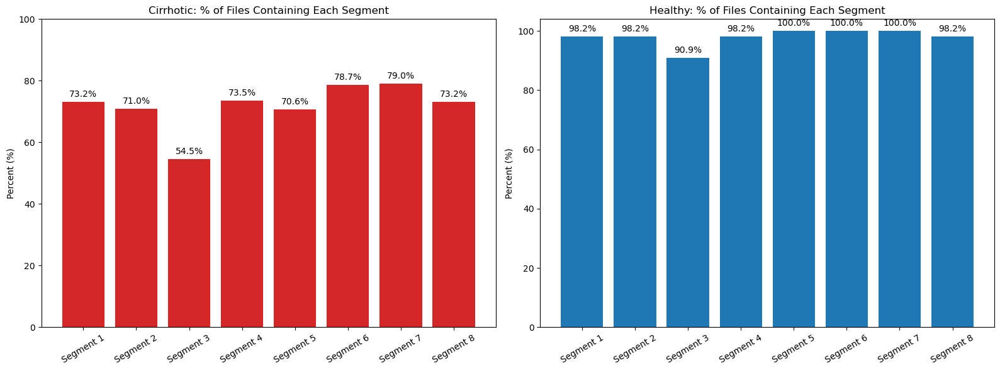

Example cirrhotic file with all 8 segments: meshreg_cirrhotic_58_vertexlabel.txt
Example healthy file with all 8 segments: meshreg_healthy_1_vertexlabel.txt


In [11]:
import numpy as np
import glob
import matplotlib.pyplot as plt
import os

# Paths and true file counts
cirrhotic_wildcard_path = '/home/ralbe/DALS/mesh_autodecoder/interactive_figures/meshreg_cirrhotic_*_vertexlabel.txt'
healthy_wildcard_path = '/home/ralbe/DALS/mesh_autodecoder/interactive_figures/meshreg_healthy_*_vertexlabel.txt'

cirrhotic_files = glob.glob(cirrhotic_wildcard_path)
healthy_files = glob.glob(healthy_wildcard_path)

# Known total number of cases (as per instruction)
total_cirrhotic_files = 310
total_healthy_files = 55

print('Found {} cirrhotic files'.format(len(cirrhotic_files)))
print('Found {} healthy files'.format(len(healthy_files)))
print('Problematic cirrhotic ids:', problematic_cirrhotic_ids)
print('Problematic healthy ids:', problematic_healthy_ids)

# --- Count for cirrhotic files ---
cirrhotic_segment_counts = np.zeros(8, dtype=int)  # index 0 is segment 1
cirrhotic_with_all_segments = None  # File example variable

for file in cirrhotic_files:
    loaded_txt = np.loadtxt(file, dtype=int)
    unique_labels = np.unique(loaded_txt)
    for label in unique_labels:
        if 1 <= label <= 8:
            cirrhotic_segment_counts[label - 1] += 1
    # Find first file with all 8 segments
    if cirrhotic_with_all_segments is None and all(seg in unique_labels for seg in range(1,9)):
        cirrhotic_with_all_segments = file

# --- Count for healthy files ---
healthy_segment_counts = np.zeros(8, dtype=int)
healthy_with_all_segments = None  # File example variable

for file in healthy_files:
    loaded_txt = np.loadtxt(file, dtype=int)
    unique_labels = np.unique(loaded_txt)
    for label in unique_labels:
        if 1 <= label <= 8:
            healthy_segment_counts[label - 1] += 1
    # Find first file with all 8 segments
    if healthy_with_all_segments is None and all(seg in unique_labels for seg in range(1,9)):
        healthy_with_all_segments = file

# --- Compute percentages for cirrhotic and healthy ---
cirrhotic_segment_percents = 100.0 * cirrhotic_segment_counts / total_cirrhotic_files
healthy_segment_percents = 100.0 * healthy_segment_counts / total_healthy_files

segment_names = [f"Segment {i+1}" for i in range(8)]

fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# Calculate top limit for y-axis to add extra space above 100%
def calc_ylim_max(percents, buffer_pct=4.0):
    m = percents.max()
    if m >= 98:
        return min(100 + buffer_pct, 110)
    return min(max(100, m + buffer_pct), 110)

ylim_cirr = calc_ylim_max(cirrhotic_segment_percents)
ylim_healthy = calc_ylim_max(healthy_segment_percents)

# All cirrhotic segments in one bar plot
axs[0].bar(segment_names, cirrhotic_segment_percents, color='tab:red')
axs[0].set_title("Cirrhotic: % of Files Containing Each Segment")
axs[0].set_ylabel("Percent (%)")
axs[0].set_ylim(0, ylim_cirr)
for i, pct in enumerate(cirrhotic_segment_percents):
    axs[0].text(i, pct + 1, f"{pct:.1f}%", ha='center', va='bottom')
axs[0].set_xticklabels(segment_names, rotation=30)

# All healthy segments in one bar plot
axs[1].bar(segment_names, healthy_segment_percents, color='tab:blue')
axs[1].set_title("Healthy: % of Files Containing Each Segment")
axs[1].set_ylabel("Percent (%)")
axs[1].set_ylim(0, ylim_healthy)
for i, pct in enumerate(healthy_segment_percents):
    axs[1].text(i, pct + 1, f"{pct:.1f}%", ha='center', va='bottom')
axs[1].set_xticklabels(segment_names, rotation=30)

plt.tight_layout()
plt.show()

# Print example files containing all 8 segments
if cirrhotic_with_all_segments:
    print(f"Example cirrhotic file with all 8 segments: {os.path.basename(cirrhotic_with_all_segments)}")
else:
    print("No cirrhotic file with all 8 segments found.")

if healthy_with_all_segments:
    print(f"Example healthy file with all 8 segments: {os.path.basename(healthy_with_all_segments)}")
else:
    print("No healthy file with all 8 segments found.")
